#### Preliminary Testing - Phase 2 - Zero Shot on VQA 

This notebook explores the following:

- Evaluating methods to mount OneDrive and Google Drive for enabling model inference on Google Colab instead of a local environment

- Experimenting with different frame sampling strategies to extract representative frames from the dataset

- Running zero-shot inference using the MiniCPM-Llama3-V-2_5-int4 VQA model on 4 sampled frames from a single video, and comparing predictions against ground truth annotations to assess accuracy

In [ ]:
import torch
print("Torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("CUDA device count:", torch.cuda.device_count())
print("CUDA device name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU found")

Torch version: 2.6.0+cu124
CUDA available: True
CUDA device count: 1
CUDA device name: Tesla T4


In [ ]:
import pprint
pp = pprint.PrettyPrinter(indent=4)

In [ ]:
# Define multiple questions

questions = [
    "What limb is injured?",
    "Is the patient intubated?",
    "Where is the catheter inserted?",
    "Is there bleeding?",
    "Has the bleeding stopped?",
    "Is the patient moving?",
    "Is the patient breathing?",
    "Is there a tourniquet?",
    "Is there a chest tube?",
    "Are the patient and instruments secured?",
    "If a limb is missing which one?",
    "Is there mechanical ventilation?",
    "What is the position of the injury?"
]

system_prompt = """Kindly analyze the image and answer the following question: {question}. The possible answers for this question are as follows: {classes}.\
 Only answer using one of possible answers and if it is not possible to select an answer, answer "NA: Cannot be determined" """

classes = [['no limb is injured', ' left leg', ' left arm', ' right leg', 'right arm'],
 ["can't identify", 'no', 'yes'],
 ['no catheter is used', 'lower limb'],
 ['no', 'yes'],
 ['there is no bleeding', 'no', 'yes'],
 ["can't identify", 'yes', 'no'],
 ["can't identify", 'no', 'yes'],
 ['no', 'yes'],
 ['no', 'yes'],
 ['no', 'yes', "can't identify"],
 ['none', 'left arm', 'left leg', 'right leg'],
 ["can't identify", 'no', 'yes'],
 ['thorax', 'throat', "can't identify", 'lower limb', 'abdomen', 'upper limb']]

### Mounting onedrive sdk
Sharepoint API

In [ ]:
import os
import requests
from bs4 import BeautifulSoup

cf_url = "https://anger-proud-cancelled-humans.trycloudflare.com/"
response = requests.get(cf_url)
soup = BeautifulSoup(response.text, 'html.parser')
video_files = [a['href'] for a in soup.find_all('a') if a['href'].endswith('.mp4')]
os.makedirs("dataset_videos", exist_ok=True)

for file in video_files:
    file_url = cf_url + file
    output_path = f"dataset_videos2/{file}"
    print(f"⬇️ Downloading: {file}")
    os.system(f'wget "{file_url}" -O "{output_path}"')

print("✅ All videos downloaded.")

⬇️ Downloading: CT11.mp4
⬇️ Downloading: CT12.mp4
⬇️ Downloading: CT13.mp4
⬇️ Downloading: CT15.mp4
⬇️ Downloading: CT18.mp4
⬇️ Downloading: CT19.mp4
⬇️ Downloading: CT2.mp4
⬇️ Downloading: CT20.mp4
⬇️ Downloading: CT21.mp4
⬇️ Downloading: CT22.mp4
⬇️ Downloading: CT25.mp4
⬇️ Downloading: CT26.mp4
⬇️ Downloading: CT27.mp4
⬇️ Downloading: CT28.mp4
⬇️ Downloading: CT3.mp4
⬇️ Downloading: CT37.mp4
⬇️ Downloading: CT5.mp4
⬇️ Downloading: CT6.mp4
⬇️ Downloading: CT8.mp4
⬇️ Downloading: IO26.mp4
⬇️ Downloading: ND11.mp4
⬇️ Downloading: ND12.mp4
⬇️ Downloading: ND13.mp4
⬇️ Downloading: ND14.mp4
⬇️ Downloading: ND15.mp4
⬇️ Downloading: ND18.mp4
⬇️ Downloading: ND19.mp4
⬇️ Downloading: ND2.mp4
⬇️ Downloading: ND20.mp4
⬇️ Downloading: ND21.mp4
⬇️ Downloading: ND22.mp4
⬇️ Downloading: ND23.mp4
⬇️ Downloading: ND3.mp4
⬇️ Downloading: ND33.mp4
⬇️ Downloading: ND34.mp4
⬇️ Downloading: ND35.mp4
⬇️ Downloading: ND37.mp4
⬇️ Downloading: ND5.mp4
⬇️ Downloading: ND6.mp4
⬇️ Downloading: ND8.mp4
⬇️ Downloa

In [ ]:
!zip -r /content/dataset_videos.zip /content/dataset_videos2//

  adding: content/dataset_videos2// (stored 0%)
  adding: content/dataset_videos2//ND5.mp4 (deflated 0%)
  adding: content/dataset_videos2//CT27.mp4 (deflated 1%)
  adding: content/dataset_videos2//ND37.mp4 (deflated 0%)
  adding: content/dataset_videos2//CT2.mp4 (deflated 0%)
  adding: content/dataset_videos2//CT20.mp4 (deflated 0%)
  adding: content/dataset_videos2//CT37.mp4 (deflated 0%)
  adding: content/dataset_videos2//ND15.mp4 (deflated 0%)
  adding: content/dataset_videos2//TQ37.mp4 (deflated 0%)
  adding: content/dataset_videos2//ND2.mp4 (deflated 0%)
  adding: content/dataset_videos2//CT8.mp4 (deflated 0%)
  adding: content/dataset_videos2//ND33.mp4 (deflated 0%)
  adding: content/dataset_videos2//CT26.mp4 (deflated 1%)
  adding: content/dataset_videos2//TQ5.mp4 (deflated 0%)
  adding: content/dataset_videos2//CT13.mp4 (deflated 0%)
  adding: content/dataset_videos2//CT22.mp4 (deflated 0%)
  adding: content/dataset_videos2//ND21.mp4 (deflated 0%)
  adding: content/dataset_vid

In [ ]:
import shutil
shutil.make_archive('/content/dataset_videos2', 'zip', '/content/dataset_videos2')

'/content/dataset_videos2.zip'

In [ ]:
!sudo apt-get update -y
!sudo apt-get install python3.7

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,383 kB]
Hit:6 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:9 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [8,804 kB]
Get:10 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [2,783 kB]
Hit:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:13 http://security.ubuntu.com/ubun

In [ ]:
# check if folder contents detected
!ls -lh "/content/drive/My Drive/track2/"

total 496M
-rw------- 1 root root 213M Mar 26 02:28 Cric6.MP4
-rw------- 1 root root 248M Mar 26 05:47 Cric8.MP4
-rw------- 1 root root  37M Mar 26 05:47 CT11.mp4


In [ ]:
# get metadata
!ffmpeg -i "/content/drive/My Drive/track2/Cric6.MP4" -filter_complex "select='gt(scene,0.1)',showinfo" -f null -

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

FRAME SAMPLING - FUNCTIONAL VERSION

In [ ]:
# Images - frames fluctuating - Saarang
# ------
# WORKING
# ------

# MODIFIABLE: folder where frames are saved
output_folder = "/content/drive/My Drive/track2/frames"
os.makedirs(output_folder, exist_ok=True)

# INPUT: number of videos
num_videos = int(input("Enter the number of videos to process: "))

video_paths = []
for i in range(num_videos):
    path = input(f"Enter Google Drive path for video {i+1}: ") # INPUT: path for each video
    # eg: /content/drive/My Drive/track2/Cric6.MP4
    video_paths.append(path.strip())

def getTotalFrames(video_path):
    cmd = [
        "ffprobe",
        "-v", "error",
        "-select_streams", "v:0",
        "-count_frames",
        "-show_entries", "stream=nb_read_frames",
        "-of", "default=nokey=1:noprint_wrappers=1",
        video_path
    ]

    result = subprocess.run(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)

    if result.returncode != 0:
        print(f"Error with video {video_path}: {result.stderr}")
        raise Exception(f"Error processing video {video_path}")

    return int(result.stdout.strip())

# get frame count of each videos
frame_counts = [getTotalFrames(video) for video in video_paths]

# find the video with lowest frame count
min_frames = min(frame_counts)
if min_frames == 0:
    print("One or more videos have no frames or could not be read.")
    raise Exception("Exiting due to invalid video frame count")

# INPUT: how many frames to sample (must be <= min_frames)
# this is to avoid selecting a frame index that exceeds the framecount of any video
num_sampled_frames = int(input(f"Enter the number of frames to sample (max {min_frames}): "))
if num_sampled_frames > min_frames:
    print(f"Reducing the number of frames to {min_frames} due to the shortest video limit.")
    num_sampled_frames = min_frames

# Randomly select frame indices
sampled_indices = sorted(random.sample(range(min_frames), num_sampled_frames))

# Extract exact same frame from all videos
for video_path in video_paths:
    video_name = os.path.splitext(os.path.basename(video_path))[0]

    for frame_num in sampled_indices:
        output_filename = f"{video_name}_frame{frame_num}.jpg" # append frame index to filenaem
        output_path = os.path.join(output_folder, output_filename)

        cmd = [
            "ffmpeg",
            "-i", video_path,
            "-vf", f"select='eq(n\\,{frame_num})'",
            "-vsync", "vfr",
            "-q:v", "2",
            output_path
        ]

        result = subprocess.run(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)

        if result.returncode != 0:
            print(f"Error extracting frame {frame_num} from video {video_path}: {result.stderr}")
            raise Exception(f"Error extracting frame {frame_num} from {video_path}")
        else:
            print(f"Extracted {output_filename}")

print(f"Extraction complete! Frames saved in {output_folder}")

Enter the number of videos to process: 3
Enter Google Drive path for video 1: /content/drive/My Drive/track2/Cric6.MP4
Enter Google Drive path for video 2: /content/drive/My Drive/track2/Cric8.MP4
Enter Google Drive path for video 3: /content/drive/My Drive/track2/CT11.mp4
Enter the number of frames to sample (max 2362): 3
Extracted Cric6_frame124.jpg
Extracted Cric6_frame528.jpg
Extracted Cric6_frame1115.jpg
Extracted Cric8_frame124.jpg
Extracted Cric8_frame528.jpg
Extracted Cric8_frame1115.jpg
Extracted CT11_frame124.jpg
Extracted CT11_frame528.jpg
Extracted CT11_frame1115.jpg
Extraction complete! Frames saved in /content/drive/My Drive/track2/frames


#### Frame Sampling

In [ ]:
import os
import random
import subprocess

# MODIFIABLE: folder where frames are saved
output_folder = "/content/drive/My Drive/track2/frames"
os.makedirs(output_folder, exist_ok=True)

# INPUT: number of videos
num_videos = int(input("Enter the number of videos to process: "))

video_paths = []
for i in range(num_videos):
    path = input(f"Enter Google Drive path for video {i+1}: ").strip()
    video_paths.append(path)

def get_scene_change_timestamps(video_path):
    """
    Detects scene changes in a video.
    A scene change occurs when difference b/w 2 consecutive frames exceeds threshold.
    Returns timestamps of frames where scene change happens.
    Else none.
    """
    cmd = [
        "ffprobe",
        "-hide_banner",
        "-loglevel", "error",
        "-select_streams", "v:0",  # first stream
        "-show_entries", "frame=pkt_pts_time",  # extract timestamps
        "-of", "csv=p=0",  # output as csv
        "-f", "lavfi",  # video filter
        f"movie={video_path},select='gt(scene,0.05)'"  # detect scene change (threshold = .05)
    ]
    result = subprocess.run(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)

    # convert to list of timestamps
    timestamps = [float(line.strip()) for line in result.stdout.strip().split("\n") if line.strip()]

    return sorted(timestamps) if timestamps else None


def get_total_frames(video_path):
    """
    Count total frames in video.
    Returns integer
    """
    cmd = [
        "ffprobe",
        "-v", "error",
        "-select_streams", "v:0",
        "-count_frames",
        "-show_entries", "stream=nb_read_frames",
        "-of", "default=nokey=1:noprint_wrappers=1",
        video_path
    ]
    result = subprocess.run(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)

    if result.returncode != 0 or not result.stdout.strip().isdigit():
        raise Exception(f"Could not get frame count for {video_path}")

    return int(result.stdout.strip())


scene_data = {}  # timestamps for scene changes
frame_count_data = {}  # total framecounts for fallback random sampling

# Collect scene change timestamps and total frames
for video in video_paths:
    scenes = get_scene_change_timestamps(video)
    if scenes:
        scene_data[video] = scenes
        print(f"Detected {len(scenes)} scene changes in {video}")
    else:
        print(f"No scene changes detected in {video}, using random frame indices.")
        total_frames = get_total_frames(video)
        frame_count_data[video] = total_frames

# Decide max number of frames we can sample
frame_counts = [get_total_frames(video) for video in video_paths]
min_frames = min(frame_counts)

# Input how many frames to sample, max should be min_frames
num_sampled_frames = int(input(f"Enter the number of frames to sample (max {min_frames}): "))
if num_sampled_frames > min_frames:
    print(f"Reducing the number of frames to {min_frames} due to the shortest video limit.")
    num_sampled_frames = min_frames

# Select sampled points (timestamps or random indices)
sampled_points = {}

# Process each video
for video in video_paths:
    scene_samples = []
    if video in scene_data:
        # Number of scenes available in the video
        num_scenes = len(scene_data[video])

        # Calculate the base number of frames to sample from each scene
        base_samples_per_scene = num_sampled_frames // num_scenes
        # Distribute any remaining samples evenly across the scenes
        extra_samples = num_sampled_frames % num_scenes

        # Distribute base samples to each scene
        for scene in range(num_scenes):
            num_samples_for_this_scene = base_samples_per_scene + (1 if scene < extra_samples else 0)

            # Ensure we do not sample more frames than are available in the scene
            num_samples_for_this_scene = min(num_samples_for_this_scene, len(scene_data[video]))

            # Randomly sample the requested number of frames for this scene
            scene_samples.extend(random.sample(scene_data[video], num_samples_for_this_scene))

        # Ensure we don't exceed the total requested frames
        scene_samples = scene_samples[:num_sampled_frames]

        # If there are fewer frames than requested, sample more frames randomly
        if len(scene_samples) < num_sampled_frames:
            remaining_samples = num_sampled_frames - len(scene_samples)
            total_video_frames = get_total_frames(video)
            random_samples = random.sample(range(total_video_frames), remaining_samples)
            scene_samples.extend(random_samples)

        sampled_points[video] = sorted(scene_samples)
    else:  # fallback to random sampling
        total = frame_count_data[video] if video in frame_count_data else min_frames
        sampled_points[video] = sorted(random.sample(range(total), num_sampled_frames))

# Extract frames
for video in video_paths:
    video_name = os.path.splitext(os.path.basename(video))[0]

    for i, point in enumerate(sampled_points[video]):
        if isinstance(point, float):  # if point is timestamp (scene-based)
            output_filename = f"{video_name}_scene_frame{i}_at_{int(point*1000)}ms.jpg"
            output_path = os.path.join(output_folder, output_filename)

            cmd = [
                "ffmpeg",
                "-ss", str(point),  # seek till timestamp
                "-i", video,
                "-frames:v", "1",
                "-q:v", "2",  # jpeg output
                output_path
            ]
        else:  # if point is frame index (random fallback)
            output_filename = f"{video_name}_rand_frame{i}_idx{point}.jpg"
            output_path = os.path.join(output_folder, output_filename)

            cmd = [
                "ffmpeg",
                "-i", video,
                "-vf", f"select='eq(n\\,{point})'",  # select specific frame by index
                "-vsync", "vfr",  # avoid duplicate frames
                "-q:v", "2",
                output_path
            ]

        result = subprocess.run(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)
        if result.returncode != 0:
            print(f"Error extracting frame {i} from {video}: {result.stderr}")
        else:
            print(f"Extracted {output_filename}")

print(f"Extraction complete. Extracted {num_sampled_frames} frames per video to: {output_folder}")


Enter the number of videos to process: 3
Enter Google Drive path for video 1: /content/drive/My Drive/track2/Cric6.MP4
Enter Google Drive path for video 2: /content/drive/My Drive/track2/Cric8.MP4
Enter Google Drive path for video 3: /content/drive/My Drive/track2/CT11.mp4
Detected 1 scene changes in /content/drive/My Drive/track2/Cric6.MP4


### Zero-shot using VQA Model - MiniCPM-Llama3-V-2_5-int4

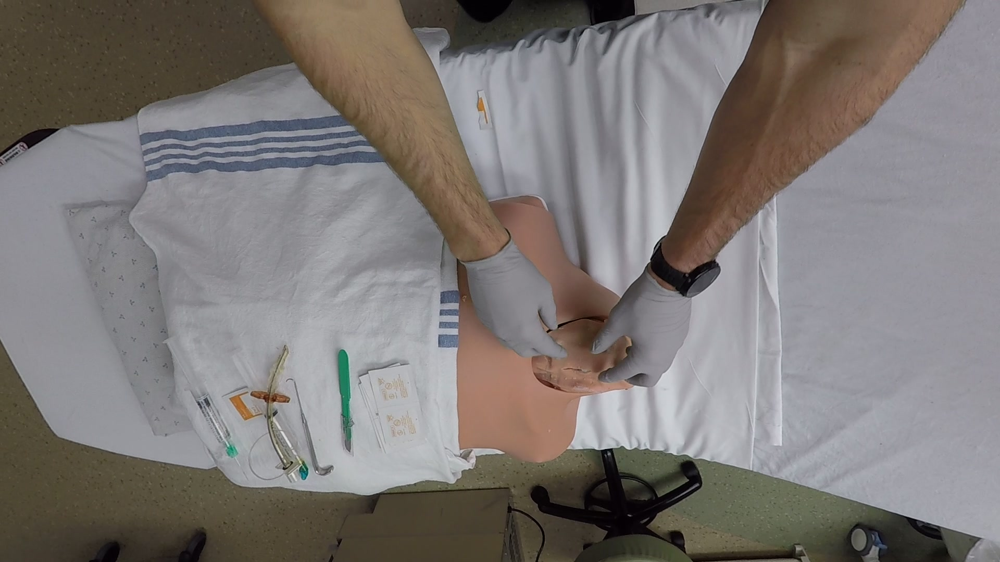

In [ ]:
from IPython.display import display
from PIL import Image

# Show the first extracted frame
img_path = "/content/drive/My Drive/task2/frames/Cric6_frame36.jpg"
img = Image.open(img_path)
display(img)

In [ ]:
!pip install Pillow sentencepiece

In [ ]:
# test.py
import torch
from PIL import Image
from transformers import AutoModel, AutoTokenizer

model = AutoModel.from_pretrained('openbmb/MiniCPM-Llama3-V-2_5-int4', trust_remote_code=True)
tokenizer = AutoTokenizer.from_pretrained('openbmb/MiniCPM-Llama3-V-2_5-int4', trust_remote_code=True)
model.eval()

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.91k [00:00<?, ?B/s]

configuration_minicpm.py:   0%|          | 0.00/4.06k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-Llama3-V-2_5-int4:
- configuration_minicpm.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_minicpmv.py:   0%|          | 0.00/25.0k [00:00<?, ?B/s]

resampler.py:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-Llama3-V-2_5-int4:
- resampler.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-Llama3-V-2_5-int4:
- modeling_minicpmv.py
- resampler.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
`low_cpu_mem_usage` was None, now default to True since model is quantized.


model.safetensors.index.json:   0%|          | 0.00/244k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.65G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/1.51G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/121 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/50.9k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.08M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/459 [00:00<?, ?B/s]

MiniCPMV(
  (llm): LlamaForCausalLM(
    (model): LlamaModel(
      (embed_tokens): Embedding(128256, 4096)
      (layers): ModuleList(
        (0-31): 32 x LlamaDecoderLayer(
          (self_attn): LlamaAttention(
            (q_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
            (k_proj): Linear4bit(in_features=4096, out_features=1024, bias=False)
            (v_proj): Linear4bit(in_features=4096, out_features=1024, bias=False)
            (o_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          )
          (mlp): LlamaMLP(
            (gate_proj): Linear4bit(in_features=4096, out_features=14336, bias=False)
            (up_proj): Linear4bit(in_features=4096, out_features=14336, bias=False)
            (down_proj): Linear4bit(in_features=14336, out_features=4096, bias=False)
            (act_fn): SiLU()
          )
          (input_layernorm): LlamaRMSNorm((4096,), eps=1e-05)
          (post_attention_layernorm): LlamaRMSNorm((4096,),

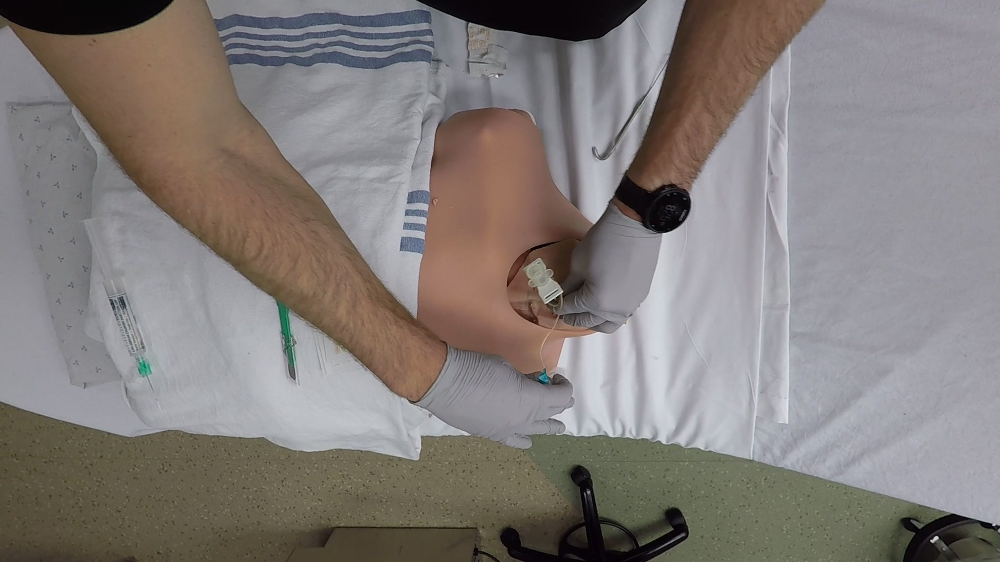

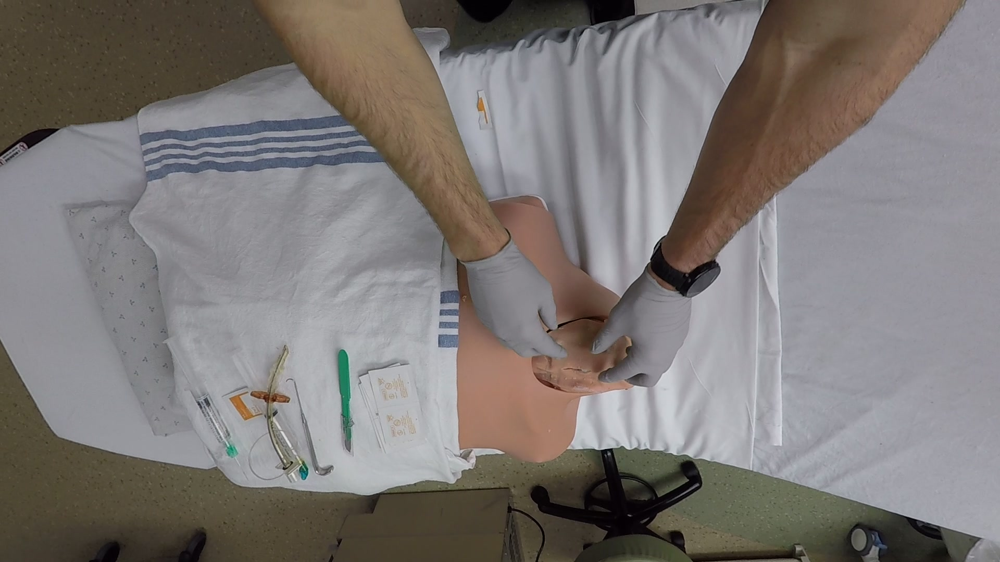

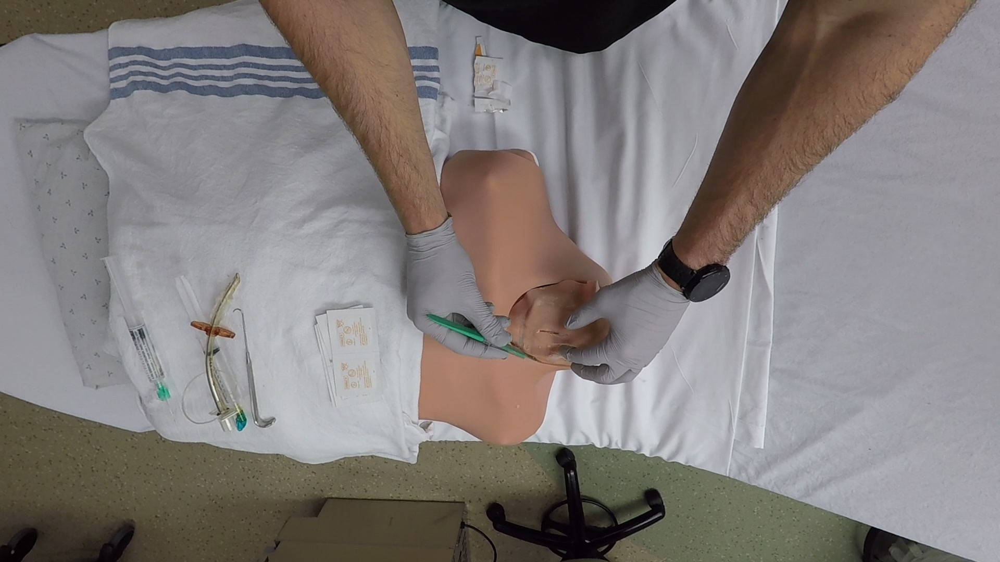

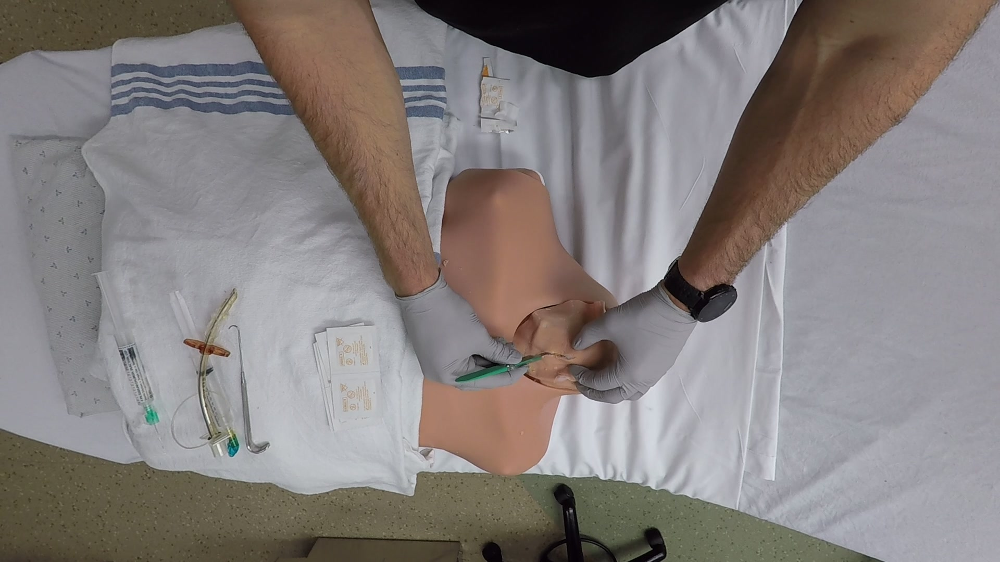

                 Image  Frame What limb is injured? Is the patient intubated?  \
0  Cric6_frame1958.jpg   1958             right arm                        no   
1    Cric6_frame36.jpg     36             right arm                        no   
2   Cric6_frame771.jpg    771              left leg                       yes   
3   Cric6_frame872.jpg    872             right arm                       yes   

  Where is the catheter inserted? Is there bleeding?  \
0                      lower limb                 no   
1        NA: Cannot be determined                 no   
2                      lower limb                 no   
3                      lower limb                 no   

  Has the bleeding stopped? Is the patient moving? Is the patient breathing?  \
0  NA: Cannot be determined                     no                       yes   
1  NA: Cannot be determined                     no                       yes   
2  NA: Cannot be determined                     no  NA: Cannot be determi

In [ ]:
import os
frames_folder = "/content/drive/My Drive/task2/frames"  # Update if needed

import re
import pandas as pd
import pprint
from IPython.display import display
from PIL import Image
#  They have never seem these images - ecocentric
#  Modify prompts - more context - mannequin
#  We offer the first egocentric view dataset of life-saving intervention (LSI) procedures with detailed annotations by medical professionals
#  Provide options - classification task

# 2 DIFFERENT PROMPT TEMPLATES - with options and without options

# Define list of specific frames
list_of_frames = ["Cric6_frame36.jpg", "Cric6_frame771.jpg", "Cric6_frame872.jpg", "Cric6_frame1958.jpg"]

# Folder where the frames are stored
frames_folder = "/content/drive/My Drive/task2/frames"  # Update if needed

# Sort and filter image files from the list
image_files = sorted([
    f for f in list_of_frames if f.lower().endswith(('.png', '.jpg', '.jpeg'))
])

pp = pprint.PrettyPrinter(indent=2)

# Process each image
# Iterate over images
results = []

# Loop over each image
for img_name in image_files:
    img_path = os.path.join(frames_folder, img_name)
    image = Image.open(img_path).convert("RGB")
    display(image)

    row = {"Image": img_name}

    # Extract frame number using regex
    match = re.search(r'_frame(\d+)', img_name)
    row["Frame"] = int(match.group(1)) if match else None

    for idx, question in enumerate(questions):
        answers = classes[idx]

## context - mannequin, white sheet, first line
        system_prompt = f"""Kindly analyze the image and answer the following question: {question}. \
The possible answers for this question are as follows: {answers}. Only answer using one of the possible answers and \
if it is not possible to select an answer, answer "NA: Cannot be determined" """

        msgs = [{'role': 'user', 'content': question}]

        res = model.chat(
            image=image,
            msgs=msgs,
            tokenizer=tokenizer,
            sampling=True,
            temperature=0.7,
            system_prompt=system_prompt
        )

        # Extract text from model response
        answer = res.strip()
        row[question] = answer

    results.append(row)

# Convert to DataFrame
df = pd.DataFrame(results)

# Reorder columns if needed
df = df[["Image", "Frame"] + questions]

# Display
print(df)


In [ ]:
df

,Image,Frame,What limb is injured?,Is the patient intubated?,Where is the catheter inserted?,Is there bleeding?,Has the bleeding stopped?,Is the patient moving?,Is the patient breathing?,Is there a tourniquet?,Is there a chest tube?,Are the patient and instruments secured?,If a limb is missing which one?,Is there mechanical ventilation?,What is the position of the injury?
0,Cric6_frame1958.jpg,1958,right arm,no,lower limb,no,NA: Cannot be determined,no,yes,no,no,yes,NA: Cannot be determined,no,NA: Cannot be determined
1,Cric6_frame36.jpg,36,right arm,no,NA: Cannot be determined,no,NA: Cannot be determined,no,yes,no,NA: Cannot be determined,yes,NA: Cannot be determined,NA: Cannot be determined,NA: Cannot be determined
2,Cric6_frame771.jpg,771,left leg,yes,lower limb,no,NA: Cannot be determined,no,NA: Cannot be determined,no,NA: Cannot be determined,yes,left leg,no,lower limb
3,Cric6_frame872.jpg,872,right arm,yes,lower limb,no,NA: Cannot be determined,no,no,yes,yes,yes,NA: Cannot be determined,no,NA: Cannot be determined


### Create another dataframe - answers to each question (14 questions) for every video (2 videos - 10 samples) - for each model

In [ ]:
data = pd.read_csv('Combined_Extracted_Answers.csv')
expected_df = data[(data["frame"].isin([1958, 36, 771, 872])) & (data["video_id"] == "Cric6")]
expected_df

,video_id,frame,What limb is injured?,Is the patient intubated?,Where is the catheter inserted?,Is there bleeding?,Has the bleeding stopped?,Is the patient moving?,Is the patient breathing?,Is there a tourniquet?,Is there a chest tube?,Are the patient and instruments secured?,If a limb is missing which one?,Is there mechanical ventilation?,What is the position of the injury?
178996,Cric6,36,no limb is injured,NaN,no catheter is used,no,there is no bleeding,can't identify,can't identify,no,no,yes,none,no,throat
179731,Cric6,771,no limb is injured,NaN,no catheter is used,no,there is no bleeding,can't identify,can't identify,no,no,yes,none,no,throat
179832,Cric6,872,no limb is injured,can't identify,no catheter is used,no,there is no bleeding,can't identify,can't identify,no,no,yes,none,NaN,throat
180918,Cric6,1958,no limb is injured,can't identify,no catheter is used,no,there is no bleeding,can't identify,can't identify,no,no,yes,none,yes,throat


In [ ]:
expected_df.columns

Index(['video_id', 'frame', 'What limb is injured?',
       'Is the patient intubated?', 'Where is the catheter inserted?',
       'Is there bleeding?', 'Has the bleeding stopped?',
       'Is the patient moving?', 'Is the patient breathing?',
       'Is there a tourniquet?', 'Is there a chest tube?',
       'Are the patient and instruments secured?',
       'If a limb is missing which one?', 'Is there mechanical ventilation?',
       'What is the position of the injury?'],
      dtype='object')